In [1]:
# For tips on running notebooks in Google Colab, see
# https://pytorch.org/tutorials/beginner/colab
%matplotlib inline


# DCGAN Tutorial

**Author**: [Nathan Inkawhich](https://github.com/inkawhich)_


In [2]:
#%matplotlib inline
from tqdm import tqdm
import argparse
import os
import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

# Set random seed for reproducibility
manualSeed = 999
#manualSeed = random.randint(1, 10000) # use if you want new results
print("Random Seed: ", manualSeed)
random.seed(manualSeed)
torch.manual_seed(manualSeed)
torch.use_deterministic_algorithms(True) # Needed for reproducible results

c:\Users\jinky\anaconda3\envs\bax\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Random Seed:  999


## Inputs

Let’s define some inputs for the run:

-  ``dataroot`` - the path to the root of the dataset folder. We will
   talk more about the dataset in the next section.
-  ``workers`` - the number of worker threads for loading the data with
   the ``DataLoader``.
-  ``batch_size`` - the batch size used in training. The DCGAN paper
   uses a batch size of 128.
-  ``image_size`` - the spatial size of the images used for training.
   This implementation defaults to 64x64. If another size is desired,
   the structures of D and G must be changed. See
   [here](https://github.com/pytorch/examples/issues/70)_ for more
   details.
-  ``nc`` - number of color channels in the input images. For color
   images this is 3.
-  ``nz`` - length of latent vector.
-  ``ngf`` - relates to the depth of feature maps carried through the
   generator.
-  ``ndf`` - sets the depth of feature maps propagated through the
   discriminator.
-  ``num_epochs`` - number of training epochs to run. Training for
   longer will probably lead to better results but will also take much
   longer.
-  ``lr`` - learning rate for training. As described in the DCGAN paper,
   this number should be 0.0002.
-  ``beta1`` - beta1 hyperparameter for Adam optimizers. As described in
   paper, this number should be 0.5.
-  ``ngpu`` - number of GPUs available. If this is 0, code will run in
   CPU mode. If this number is greater than 0 it will run on that number
   of GPUs.




In [3]:
# 데이터 셋 폴더 path
dataroot = "data/celeba"

# Number of workers for dataloader 2 
workers = 2

# Batch size during training (in paper) 128
batch_size = 4

# 훈련에 사용되는 이미지의 공간적 크기. (default=64x64, 다른 크기 원할 경우 -> D와 G 구조 변경해야 함) 64
image_size = 384

# 입력 이미지의 색상 채널 수. 컬러 이미지의 경우 3
nc = 3

# 잠재 벡터의 길이 100
nz = 100

# 생성기를 통해 전달되는 특징 맵의 깊이(크기)와 관련됨 64
ngf = 64

# 판별자를 통해 전파되는 특징 맵의 깊이를 설정 64
ndf = 64

# 훈련할 에폭 수 5 
num_epochs = 5

# 훈련을 위한 학습률. (in paper) 0.0002
lr = 0.0002

# Adam 최적화 프로그램의 베타1 하이퍼파라미터 (in paper) 0.5
beta1 = 0.5

# 사용 가능한 GPU 수. 0 == CPU, 0 < GPU
ngpu = 1

## Data

In this tutorial we will use the [Celeb-A Faces
dataset](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html)_ which can
be downloaded at the linked site, or in [Google
Drive](https://drive.google.com/drive/folders/0B7EVK8r0v71pTUZsaXdaSnZBZzg)_.
The dataset will download as a file named ``img_align_celeba.zip``. Once
downloaded, create a directory named ``celeba`` and extract the zip file
into that directory. Then, set the ``dataroot`` input for this notebook to
the ``celeba`` directory you just created. The resulting directory
structure should be:

::

   /path/to/celeba
       -> img_align_celeba  
           -> 188242.jpg
           -> 173822.jpg
           -> 284702.jpg
           -> 537394.jpg
              ...

This is an important step because we will be using the ``ImageFolder``
dataset class, which requires there to be subdirectories in the
dataset root folder. Now, we can create the dataset, create the
dataloader, set the device to run on, and finally visualize some of the
training data.




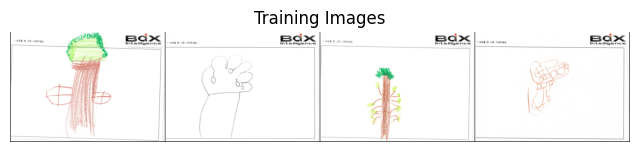

In [4]:
# 중요 (데이터 셋 루트 폴더에 하위 디렉토리가 있어야 하는 데이터 셋 클래스를 사용할 것이기 때문)
# 데이터 셋 생성 / 데이터 로더 생성 / 실행 장치 설정 / 훈련 데이터 중 일부 시각화
dataset = dset.ImageFolder(root=dataroot,
                           transform=transforms.Compose([
                               transforms.Resize(image_size),
                               transforms.ToTensor(),
                               transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                           ]))
# Create the dataloader
dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size,
                                         shuffle=True, num_workers=workers)

# Decide which device we want to run on
device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "cpu")

# Plot some training images
real_batch = next(iter(dataloader))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))

## Implementation (구현)

With our input parameters set and the dataset prepared, we can now get
into the implementation. We will start with the weight initialization
strategy, then talk about the generator, discriminator, loss functions,
and training loop in detail.

### Weight Initialization (가중치 초기화)

From the DCGAN paper, the authors specify that all model weights shall
be randomly initialized from a Normal distribution with ``mean=0``,
``stdev=0.02``. The ``weights_init`` function takes an initialized model as
input and reinitializes all convolutional, convolutional-transpose, and
batch normalization layers to meet this criteria. This function is
applied to the models immediately after initialization.




#### 입력 매개변수 셋과 데이터 셋이 준비되었으므로 구현 가능

In [5]:
# 모든 모델 가중치가 정규 분포에서 초기화되어야 한다고 지정 (in paper)
# (평균)mean=0, (표준편차)stdev=0.02
# 초기화된 모델을 입력으로 사용하고 이 기준을 충족하기 위해 모든 컨벌루션, 컨벌루션-전치 및 배치 정규화 레이어를 다시 초기화
# 초기화 직후 모델에 적용
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

### Generator

The generator, $G$, is designed to map the latent space vector
($z$) to data-space. Since our data are images, converting
$z$ to data-space means ultimately creating a RGB image with the
same size as the training images (i.e. 3x64x64). In practice, this is
accomplished through a series of strided two dimensional convolutional
transpose layers, each paired with a 2d batch norm layer and a relu
activation. The output of the generator is fed through a tanh function
to return it to the input data range of $[-1,1]$. It is worth
noting the existence of the batch norm functions after the
conv-transpose layers, as this is a critical contribution of the DCGAN
paper. These layers help with the flow of gradients during training. An
image of the generator from the DCGAN paper is shown below.

.. figure:: /_static/img/dcgan_generator.png
   :alt: dcgan_generator

Notice, how the inputs we set in the input section (``nz``, ``ngf``, and
``nc``) influence the generator architecture in code. ``nz`` is the length
of the z input vector, ``ngf`` relates to the size of the feature maps
that are propagated through the generator, and ``nc`` is the number of
channels in the output image (set to 3 for RGB images). Below is the
code for the generator.




In [6]:
# Generator Code 생성자 (G)
# 잠재 공간 벡터를 매핑하도록 설계
# 훈련 이미지와 동일한 크기 (ex: 3x64x64)의 RGB 이미지 생성을 의미
# stride된 Cov2D layer를 통해 수행되며, 각 layer는 2D 배치 표준 layer 및 relu 쌍을 이룸
# 생성기의 출력은 tanh() 를 통해 입력 데이터 범위로 반환함 (-1 ~ 1)
# 전치(conv-transpose) layer 뒤에 BatchNorm2d 함수가 존재한다는 점 중요 -> 훈련 중 기울기 흐름에 도움이 됨
class Generator(nn.Module):
    def __init__(self, ngpu):
        super(Generator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            nn.ConvTranspose2d( nz, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 4, 2, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            nn.ConvTranspose2d( ngf * 4, ngf * 2, 8, 4, 2, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            nn.ConvTranspose2d( ngf * 2, ngf, 8, 4, 2, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            nn.ConvTranspose2d( ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()

        )

    def forward(self, input):
        return self.main(input)

In [7]:
# for batch in dataloader:
#     break

In [8]:
# model = Generator(1)
# model.to(device)

In [9]:
# noise = torch.randn(b_size, nz, 1, 1, device=device)
# model(noise).shape

Now, we can instantiate the generator and apply the ``weights_init``
function. Check out the printed model to see how the generator object is
structured.




### 생성기 개체가 어떻게 구성되어 있는지

In [10]:
# Create the generator
netG = Generator(ngpu).to(device)

# Handle multi-GPU if desired
if (device.type == 'cuda') and (ngpu > 1):
    netG = nn.DataParallel(netG, list(range(ngpu)))

# Apply the ``weights_init`` function to randomly initialize all weights
#  to ``mean=0``, ``stdev=0.02``.
netG.apply(weights_init)

# Print the model
print(netG)

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(4, 4), padding=(2, 2), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(8, 8), stride=(4, 4), padding=(2, 2), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(8, 8), stride=(4, 4), padding=(2, 2), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)


### Discriminator

As mentioned, the discriminator, $D$, is a binary classification
network that takes an image as input and outputs a scalar probability
that the input image is real (as opposed to fake). Here, $D$ takes
a 3x64x64 input image, processes it through a series of Conv2d,
BatchNorm2d, and LeakyReLU layers, and outputs the final probability
through a Sigmoid activation function. This architecture can be extended
with more layers if necessary for the problem, but there is significance
to the use of the strided convolution, BatchNorm, and LeakyReLUs. The
DCGAN paper mentions it is a good practice to use strided convolution
rather than pooling to downsample because it lets the network learn its
own pooling function. Also batch norm and leaky relu functions promote
healthy gradient flow which is critical for the learning process of both
$G$ and $D$.




Discriminator Code



In [11]:
# Discriminator Code 판별자 (D)
# 이미지를 입력으로 사용하고 입력 이미지가 진짜(가짜가 아님)일 확률을 스칼라 확률로 출력하는 이진 분류 네트워크
# 입력 이미지(3x64x64)를 가져와 일련의 Conv2d, BatchNorm2d 및 LeakyReLU 레이어를 통해 처리한 다음 Sigmoid 활성화 함수를 통해 최종 확률을 출력
# DCGAN 논문에서는 다운샘플링을 위해 풀링보다는 스트라이드 컨볼루션을 사용하는 것이 네트워크가 자체 풀링 기능을 학습할 수 있게 해주기 때문에 좋은 습관이라고 언급
# BatchNorm 및 Leaky Relu 함수 : 두 가지 모두의 학습 과정에 중요한 healthy gradient flow룰 촉진
class Discriminator(nn.Module):
    def __init__(self, ngpu):
        super(Discriminator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf, ndf * 2, 8, 4, 2, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf * 2, ndf * 4, 8, 4, 2, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf * 4, ndf * 8, 4, 4, 2, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input)

In [17]:
output

tensor([0.4538, 0.8281, 0.1857, 0.9149, 0.2181, 0.6551, 0.2402, 0.6562],
       device='cuda:0', grad_fn=<ViewBackward0>)

Now, as with the generator, we can create the discriminator, apply the
``weights_init`` function, and print the model’s structure.




### 판별자 개체가 어떻게 구성되어 있는지

In [12]:
# Create the Discriminator
netD = Discriminator(ngpu).to(device)

# Handle multi-GPU if desired
if (device.type == 'cuda') and (ngpu > 1):
    netD = nn.DataParallel(netD, list(range(ngpu)))
    
# Apply the ``weights_init`` function to randomly initialize all weights
# like this: ``to mean=0, stdev=0.2``.
netD.apply(weights_init)

# Print the model
print(netD)

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(8, 8), stride=(4, 4), padding=(2, 2), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(8, 8), stride=(4, 4), padding=(2, 2), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(4, 4), padding=(2, 2), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)


### Loss Functions and Optimizers

With $D$ and $G$ setup, we can specify how they learn
through the loss functions and optimizers. We will use the Binary Cross
Entropy loss
([BCELoss](https://pytorch.org/docs/stable/generated/torch.nn.BCELoss.html#torch.nn.BCELoss)_)
function which is defined in PyTorch as:

\begin{align}\ell(x, y) = L = \{l_1,\dots,l_N\}^\top, \quad l_n = - \left[ y_n \cdot \log x_n + (1 - y_n) \cdot \log (1 - x_n) \right]\end{align}

Notice how this function provides the calculation of both log components
in the objective function (i.e. $log(D(x))$ and
$log(1-D(G(z)))$). We can specify what part of the BCE equation to
use with the $y$ input. This is accomplished in the training loop
which is coming up soon, but it is important to understand how we can
choose which component we wish to calculate just by changing $y$
(i.e. GT labels).

Next, we define our real label as 1 and the fake label as 0. These
labels will be used when calculating the losses of $D$ and
$G$, and this is also the convention used in the original GAN
paper. Finally, we set up two separate optimizers, one for $D$ and
one for $G$. As specified in the DCGAN paper, both are Adam
optimizers with learning rate 0.0002 and Beta1 = 0.5. For keeping track
of the generator’s learning progression, we will generate a fixed batch
of latent vectors that are drawn from a Gaussian distribution
(i.e. fixed_noise) . In the training loop, we will periodically input
this fixed_noise into $G$, and over the iterations we will see
images form out of the noise.




In [13]:
# Binary Cross Entropy loss : Initialize the ``BCELoss`` function
criterion = nn.BCELoss()

# Create batch of latent vectors that we will use to visualize
#  the progression of the generator
# 생성기의 학습 진행 상황을 추적하기 위해 가우시안 분포(즉,fixed_noise)에서 추출된 고정된 잠재 벡터 배치를 생성
# 훈련 루프에서는 생성자(G)에게 fixed_noise 주기적으로 입력 -> 그리고 반복을 통해 노이즈로 인해 이미지가 형성되는 것을 볼 수 있음
fixed_noise = torch.randn(64, nz, 1, 1, device=device)

# label 정의
real_label = 1.
fake_label = 0.

# Setup Adam optimizers for both G and D
optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))

### Training

-  **Loss_D** - 모든 실제 배치와 모든 가짜 배치에 대한 손실의 합으로 계산된 Discriminator 손실 ($log(D(x)) + log(1 - D(G(z)))$).
-  **Loss_G** - Generator 손실은 다음과 같이 계산됩니다. $log(D(G(z)))$
-  **D(x)** - 모든 실제 배치에 대한 Discriminator의 평균 출력(배치 전체)입니다. 이는 1에 가깝게 시작하여 G가 좋아지면 이론적으로 0.5로 수렴해야 합니다.
-  **D(G(z))** -  모든 가짜 배치에 대한 평균 판별기 출력입니다. 첫 번째 숫자는 D가 업데이트되기 전이고 두 번째 숫자는 D가 업데이트된 후입니다. 이 숫자는 0 근처에서 시작하여 G가 좋아짐에 따라 0.5로 수렴되어야 합니다.




In [14]:
# Training Loop
# 실제 이미지와 가짜 이미지에 대해 서로 다른 미니 배치를 구성하고 G의 목적 함수를 조정하여 최대화


# 1부 - 판별자 훈련
# 판별기 훈련의 목표 : 주어진 입력을 실제 또는 가짜로 올바르게 분류할 확률을 최대화하는 것
# 확률적 기울기를 높여 판별기를 업데이트
# 미니 배치 두 단계로 계산
# 1. 먼저 훈련 세트에서 실제 샘플 배치를 구성하고 forward pass를 통해 (D) 손실을 계산, 그 다음 backward pass에서 기울기를 계산
# 2. 현재 생성기로 가짜 샘플 배치를 구성하고 이 배치를 foaward pass를 통해 (D) 손실을 계산, 그 다음 backward pass를 사용하여 gradient 누적
# 이제 실제 배치와 가짜 배치 모두에서 누적된 gradient를 사용하여 판별기의 최적화 단계 호출

# 2부 - 생성기 훈련
# 생성기 훈련의 목표 : 생성기를 최소화하여 생성기를 훈련
# 더 나은 가짜를 만들기 위한 노력
# 특히 학습 과정 초기에 충분한 기울기를 제공하지 못하는 것으로 나타남
# 수정 사항으로 Discriminator를 사용하여 1부의 Generator 출력을 분류하고, 실제 label을 GT로 사용하여 (G)의 손실을 계산
# backward pass에서 (G)의 기울기를 계산
# 마지막으로 최적화 단계로 (G)의 매개변수를 업데이트
# 실제 label을 손실 함수의 GT label로 사용 (BCELoss)

# 마지막으로 훈련 진행 상황 시각화

img_list = []
G_losses = []
D_losses = []
iters = 0

print("Starting Training Loop...")
# For each epoch
for epoch in range(num_epochs):
    # For each batch in the dataloader
    for i, data in enumerate(dataloader, 0):
        
        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        ## Train with all-real batch
        netD.zero_grad()
        # Format batch
        real_cpu = data[0].to(device)
        b_size = real_cpu.size(0)
        label = torch.full((b_size,), real_label, dtype=torch.float, device=device)
        # Forward pass real batch through D
        output = netD(real_cpu).view(-1)
        # Calculate loss on all-real batch
        errD_real = criterion(output, label)
        # Calculate gradients for D in backward pass
        errD_real.backward()
        D_x = output.mean().item()

        ## Train with all-fake batch
        # Generate batch of latent vectors
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        # Generate fake image batch with G
        fake = netG(noise)
        label.fill_(fake_label)
        # Classify all fake batch with D
        output = netD(fake.detach()).view(-1)
        # Calculate D's loss on the all-fake batch
        errD_fake = criterion(output, label)
        # Calculate the gradients for this batch, accumulated (summed) with previous gradients
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        # Compute error of D as sum over the fake and the real batches
        errD = errD_real + errD_fake
        # Update D
        optimizerD.step()

        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        netG.zero_grad()
        label.fill_(real_label)  # fake labels are real for generator cost
        # Since we just updated D, perform another forward pass of all-fake batch through D
        output = netD(fake).view(-1)
        # Calculate G's loss based on this output
        errG = criterion(output, label)
        # Calculate gradients for G
        errG.backward()
        D_G_z2 = output.mean().item()
        # Update G
        optimizerG.step()
        
        # Output training stats
        if i % 50 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, i, len(dataloader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))
        
        # Save Losses for plotting later
        G_losses.append(errG.item())
        
        
        D_losses.append(errD.item())
        
        # Check how the generator is doing by saving G's output on fixed_noise
        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))
            
        iters += 1

Starting Training Loop...


ValueError: Using a target size (torch.Size([4])) that is different to the input size (torch.Size([8])) is deprecated. Please ensure they have the same size.

## Results

마지막으로 우리가 어떻게 했는지 확인해 보겠습니다. 여기서는 세 가지 다른 결과를 살펴보겠습니다. 먼저 훈련 중에 D와 G의 손실이 어떻게 변했는지 살펴보겠습니다. 둘째, 모든 에포크에 대해 fixed_noise batch에 대한 G의 출력을 시각화합니다. 셋째, G의 가짜 데이터 배치 옆에 실제 데이터 배치를 살펴보겠습니다.

**Loss versus training iteration**

Below is a plot of D & G’s losses versus training iterations.




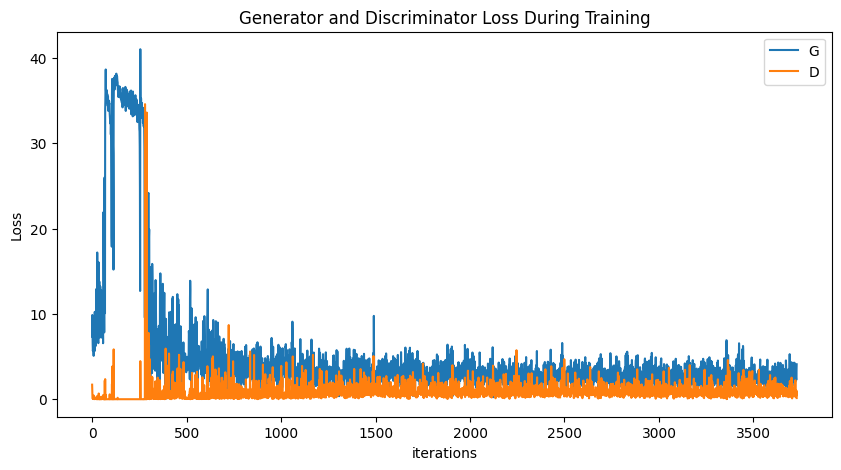

In [ ]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

**G의 진행 상황 시각화**

훈련의 매 에포크 후에 어떻게 고정 잡음 배치에 생성기의 출력을 저장했는지 기억하세요. 이제 G의 훈련 진행 상황을 애니메이션으로 시각화할 수 있습니다.




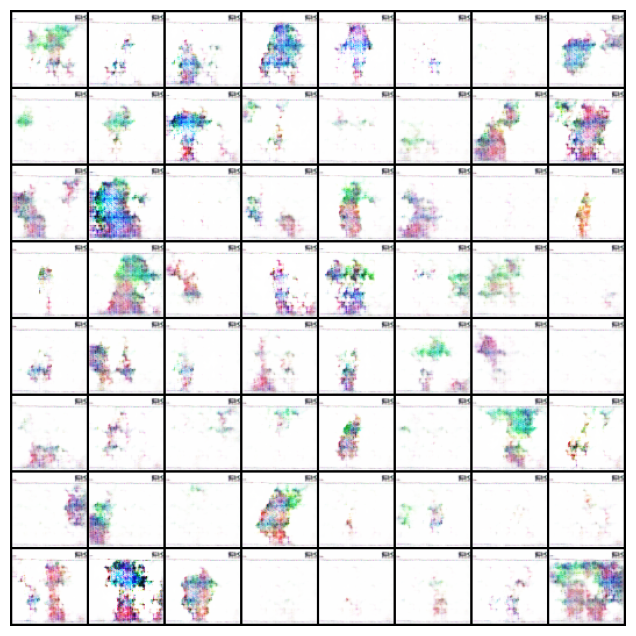

In [ ]:

fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

**Real Images vs. Fake Images**

Finally, lets take a look at some real images and fake images side by
side.




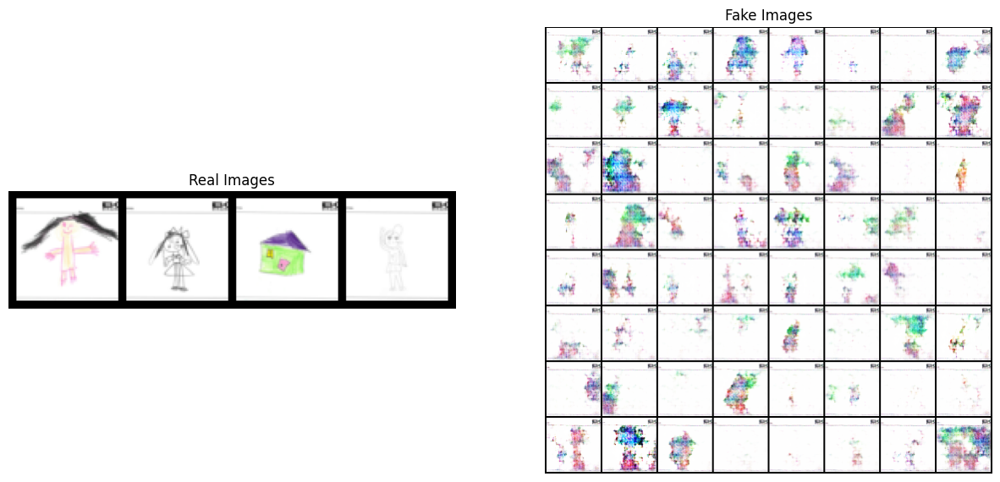

In [ ]:
# Grab a batch of real images from the dataloader
real_batch = next(iter(dataloader))

# Plot the real images
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))

# Plot the fake images from the last epoch
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1],(1,2,0)))
plt.show()